Ноутбук служит основой для изучения, однако многое нужно будет поискать и почитать самостоятельно. Никто вас не ограничивает в наведении красоты, но требуется выполнение того, что в задании.

Это последняя домашка на код! Здесь вам нужно будет сделать читаемый ноутбук с ответами на вопросы и выполнением заданий.
***

In [1]:
import pandas as pd
import numpy as np
import geopandas as gpd
from geopy.distance import geodesic
import json

import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import seaborn as sns

# Данные (3 pt)

## Обычные данные (2 pt)

Как понятно по названию — фокусом этой домашки будут **геоданные**. Не то, чтобы эти данные как-то принципиально отличаются от всех других, просто они имеют весьма конкретное значение. 

> В этом задании сделаем упор на **визуализацию и бизнесовую интерпретацию** данных.

В качестве данных возьмем информацию о [поездках на такси в Нью-Йорке](https://www.kaggle.com/datasets/elemento/nyc-yellow-taxi-trip-data?select=yellow_tripdata_2016-03.csv) за март 2016 года. Однако полный датасет имеет размер `(12210952, 19)`, что для нас слишком много, поэтому ограничимся только _одним днем_ и не всеми колонками.

In [2]:
df = pd.read_csv('yellow_tripdata_2016-03-01.csv')
print(df.shape)
df.head()

(372868, 10)


,tpep_pickup_datetime,tpep_dropoff_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_distance,passenger_count,fare_amount,total_amount
0,2016-03-01 00:00:00,2016-03-01 00:07:55,-73.976746,40.765152,-74.004265,40.746128,2.50,1,9.0,12.35
1,2016-03-01 00:00:00,2016-03-01 00:11:06,-73.983482,40.767925,-74.005943,40.733166,2.90,1,11.0,15.35
2,2016-03-01 00:00:00,2016-03-01 00:31:06,-73.782021,40.644810,-73.974541,40.675770,19.98,2,54.5,63.80
3,2016-03-01 00:00:00,2016-03-01 00:00:00,-73.863419,40.769814,-73.969650,40.757767,10.78,3,31.5,41.62
4,2016-03-01 00:00:00,2016-03-01 00:00:00,-73.971741,40.792183,-74.177170,40.695053,30.43,5,98.0,113.80


**ЗАДАНИЕ**

Изучите данные, поймите названия столбцов и проверьте/обработайте ошибки и пропуски в данных.

In [3]:
df.columns

Index(['tpep_pickup_datetime', 'tpep_dropoff_datetime', 'pickup_longitude',
       'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude',
       'trip_distance', 'passenger_count', 'fare_amount', 'total_amount'],
      dtype='str')

In [4]:
passengers = df['passenger_count']
print(df.describe())
passengers.value_counts()

       pickup_longitude  pickup_latitude  dropoff_longitude  dropoff_latitude  \
count     372868.000000    372868.000000      372868.000000     372868.000000   
mean         -72.910216        40.167043         -72.961985         40.195927   
std            8.801948         4.849117           8.591247          4.733122   
min          -82.706528         0.000000         -81.018280          0.000000   
25%          -73.991043        40.739120         -73.990593         40.737343   
50%          -73.980232        40.755402         -73.978676         40.755396   
75%          -73.965645        40.768883         -73.962135         40.770458   
max            0.000000        42.786934           0.000000         42.786934   

       trip_distance  passenger_count    fare_amount   total_amount  
count   3.728680e+05    372868.000000  372868.000000  372868.000000  
mean    1.624241e+01         1.615588      12.389629      15.701020  
std     8.188272e+03         1.296420      10.499631      13

passenger_count
1    274754
2     47973
5     19537
3     12872
6     12280
4      5428
0        23
8         1
Name: count, dtype: int64

In [5]:
df = df[df['passenger_count'].between(1, 6)] # очевидно, пассажиров не может быть 0, 8 считаем выбросом, который проще удалить
df = df[df['total_amount'].between(1, 1000)]
df = df[df['fare_amount'].between(1, 1000)]

# искренне верим, что ехать невероятно много миль по нью йорку - странно, это выбросы, которые лучше убрать
df = df[(df['trip_distance'] > 0) & (df['trip_distance'] < df['trip_distance'].quantile(0.99))]

# и ещё более странно - телепортироваться
df = df[df['pickup_longitude'].between(-85, -73)]
df = df[df['dropoff_longitude'].between(-85, -73)]
df = df[df['dropoff_latitude'].between(39, 44)] 
df = df[df['pickup_latitude'].between(39, 44)]

print(df.shape)
df.describe()

(361750, 10)


,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_distance,passenger_count,fare_amount,total_amount
count,361750.000000,361750.000000,361750.000000,361750.000000,361750.000000,361750.000000,361750.000000,361750.000000
mean,-73.974264,40.753167,-73.974055,40.753477,2.665049,1.619892,11.896945,15.095881
std,0.038956,0.026409,0.033328,0.030569,2.978043,1.301630,8.934752,11.281994
min,-82.706528,39.597969,-81.018280,39.538055,0.010000,1.000000,2.000000,2.780000
25%,-73.991241,40.740456,-73.990746,40.738682,1.000000,1.000000,6.500000,8.750000
50%,-73.980751,40.755896,-73.978973,40.755791,1.620000,1.000000,9.000000,11.760000
75%,-73.966911,40.769188,-73.963341,40.770706,2.930000,2.000000,14.000000,17.150000
max,-73.550453,41.077045,-73.550453,41.077045,18.390000,6.000000,250.000000,677.880000


**ЗАДАНИЕ**

Для анализа нам точно понадобится знать еще и длительность и расстояния поездок, поэтому давайте создадим столбцы `trip_duration` и `distance_between_points`: длительность (в минутах) и расстояние между пунктом начала и назначения соответственно.

Понятно, что евклидово расстояние считать не совсем честно (не плоская земля все же), поэтому воспользуемся `geopy.distance.geodesic`, которая по-умному все посчитает за нас) _Не забудьте перевести все в те единицы измерения, в которых расстояние в данных, чтобы можно было сравнивать._

In [6]:
df['tpep_pickup_datetime'] = pd.to_datetime(df['tpep_pickup_datetime'])
df['tpep_dropoff_datetime'] = pd.to_datetime(df['tpep_dropoff_datetime'])

# не забудьте и тут убрать странные поездки, например с нулевым или отрицательным временем
df['trip_duration'] = (df['tpep_dropoff_datetime'] - df['tpep_pickup_datetime']).dt.total_seconds() / 60
df = df[df['trip_duration'] > 0] 

# уже на графике обнаружил, что какой-то гений умудрился сутки ехать за 20$. не верим
df = df[df['trip_duration'].between(1, 180)]

def get_dist(row):
    pickup = (row['pickup_latitude'], row['pickup_longitude'])
    dropoff = (row['dropoff_latitude'], row['dropoff_longitude'])
    return geodesic(pickup, dropoff).miles

df['distance_between_points'] = df.apply(get_dist, axis=1)

df.shape

(360357, 12)

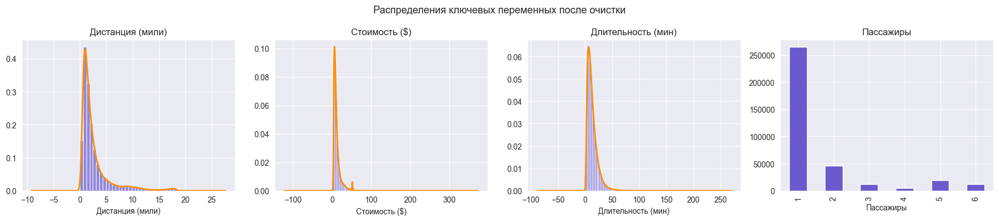

In [7]:
fig, axes = plt.subplots(1, 4, figsize=(18, 4))
fig.suptitle('Распределения ключевых переменных после очистки', fontsize=13)

cols = [
    ('trip_distance', 'Дистанция (мили)', 30),
    ('fare_amount', 'Стоимость ($)', 60),
    ('trip_duration', 'Длительность (мин)', 60),
    ('passenger_count', 'Пассажиры', range(1, 8)),
]

for ax, (col, label, bins) in zip(axes, cols):
    if col == 'passenger_count':
        df[col].value_counts().sort_index().plot(kind='bar', ax=ax, color='slateblue', edgecolor='white')
        ax.set_xlabel(label)
    else:
        ax.hist(df[col], bins=bins, color='slateblue', edgecolor='white', density=True, alpha=0.7)
        df[col].plot(kind='kde', ax=ax, color='darkorange', linewidth=2)
        ax.set_xlabel(label)
    ax.set_title(label)
    ax.set_ylabel('')

plt.tight_layout()
plt.show()

**ЗАДАНИЕ**

Также для будущего удобства давайте создадим столбец `pickup_hour`, в которо целым числом отметим, в каком часу (0-23) была начата поездка. И еще столбец `cost_per_mile` — стоимость мили в этой поездке (считать по расстоянию поездки). Это нам пригодится для визуализации.

In [8]:
df['pickup_hour'] = df['tpep_pickup_datetime'].dt.hour
# мне не понравилось, как выглядит график "час vs количество пассажиров", ваще не информативно, поэтому меняю
df['pickup_time_float'] = df['tpep_pickup_datetime'].dt.hour + df['tpep_pickup_datetime'].dt.minute / 60

df['cost_per_mile']  = df['total_amount'] / df['trip_distance']

df = df.dropna(subset=['pickup_hour', 'cost_per_mile'])
df.shape

(360357, 15)

_Нам еще понадобятся преобразования данных, но будем их делать чуть позже_

## Необычные данные (1 pt)

Данные о поездках у нас есть, но как их «подружить» со знаниями о городе? Можно через какое-нибудь API получать адреса по геопозиции, но это довольно долго и иногда небесплатно для учебной задачи, поэтому будем работать с новым форматом данных и знаниями о **районах города**.

Для этого дела нам понадобится библиотека `geopandas`, вот [русский гайд](https://habr.com/ru/articles/515328/),
а вот ваша любимая [документация](https://geopandas.org/en/stable/) (и даже [гит](https://github.com/geopandas/geopandas)). Она нам сильно не понадобится, но вдруг вам интересно.

In [9]:
gdf = gpd.read_file('Borough_Boundaries_nyc.geojson').to_crs("EPSG:4326")
gdf

,:id,:version,:created_at,:updated_at,borocode,boroname,shape_area,shape_leng,geometry
0,row-sn28~av3k.vwsa,rv-665b-x5bf.pjx5,2026-03-09 20:59:40.758000+00:00,2026-03-09 20:59:40.758000+00:00,5,Staten Island,1623618358.46,325912.288988,"MULTIPOLYGON (((-74.05051 40.56642, -74.05047 ..."
1,row-g9mx.4xiy-tp3g,rv-f783_n7nw_4zya,2026-03-09 20:59:40.758000+00:00,2026-03-09 20:59:40.758000+00:00,1,Manhattan,636631650.451,359537.866079,"MULTIPOLYGON (((-74.01093 40.68449, -74.01193 ..."
2,row-2e6v~vna8_nnub,rv-xhj4.y6me_fsbi,2026-03-09 20:59:40.758000+00:00,2026-03-09 20:59:40.758000+00:00,2,Bronx,1187199300.36,463147.071867,"MULTIPOLYGON (((-73.89681 40.79581, -73.89694 ..."
3,row-z4zg_8qgh.py9g,rv-c5dp~tszd.xcv4,2026-03-09 20:59:40.758000+00:00,2026-03-09 20:59:40.758000+00:00,3,Brooklyn,1934462607.43,726953.044632,"MULTIPOLYGON (((-73.86327 40.58388, -73.86381 ..."
4,row-ii38~xmid.7jq2,rv-99dx-r5hs.vcwe,2026-03-09 20:59:40.758000+00:00,2026-03-09 20:59:40.758000+00:00,4,Queens,3041419178.99,887905.076018,"MULTIPOLYGON (((-73.82645 40.59053, -73.82642 ..."


Нам интереснее всего последний столбец, который задает **геометрию районов**. С помощью него мы сможем **групировать наши большие данные по районам** и делать более комплексный анализ.

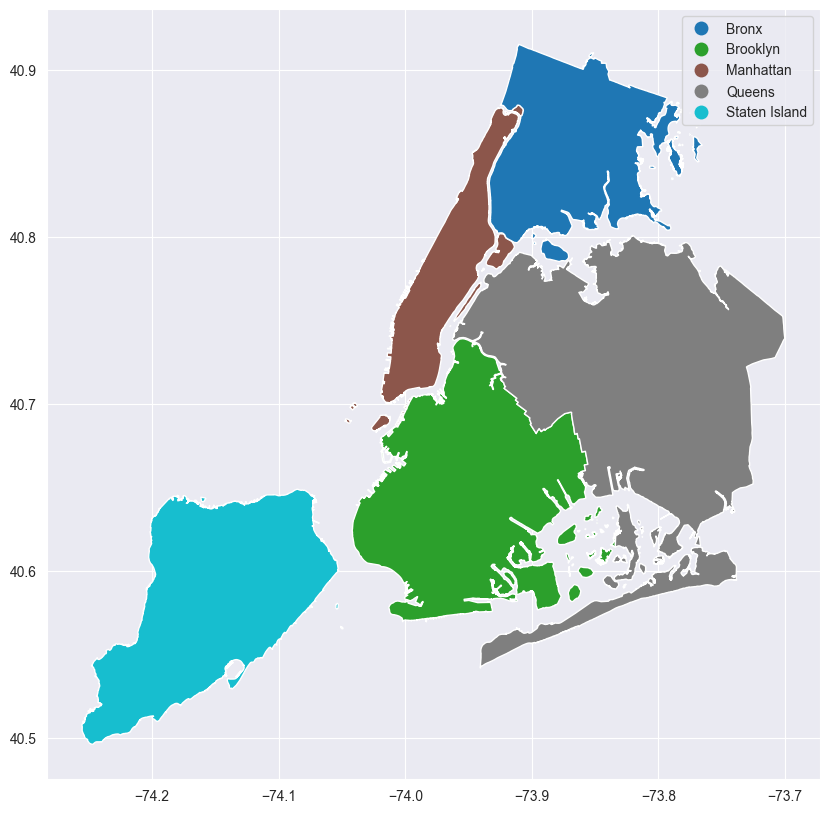

In [10]:
gdf.plot(column='boroname', legend=True, figsize=(10, 10))
plt.show()

**ЗАДАНИЕ**

Давайте теперь соединим наши данные и добавим столбцы `pickup_district` и `dropoff_district` с названиями районов.

Для этого будем дейстовать по такому алгоритму
1. Создадим `gpd.GeoDataFrame` для точек старта и финиша, то есть приведем к понятному для геопандаса виду. Для этого нужно передать в параметр `geometry` объект точки (объект геопандаса), используйте для этого [`gpd.points_from_xy`](https://geopandas.org/en/stable/docs/reference/api/geopandas.points_from_xy.html) _<- это ссылка_.
2. Сопоставим названия райнов и точек. Для этого надо передать наши точки и данные из районов, а именно имя и геометрию. Используйте для этого [`gpd.sjoin`](https://geopandas.org/en/v1.1.2/docs/reference/api/geopandas.sjoin.html) _<- это тоже ссылка_.
3. Создаем новый столбец в наших данных (просто переклеиваем столбез из прошлого пункта).
4. Убираем точки вне районов (можно поставить специальный маркер, но он может потом помешать при визуализайии).

In [11]:
gdf_pickup = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df['pickup_longitude'], df['pickup_latitude']), crs="EPSG:4326")
gdf_dropoff = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df['dropoff_longitude'], df['dropoff_latitude']), crs="EPSG:4326")

pickup_join = gpd.sjoin(gdf_pickup, gdf[['boroname', 'geometry']], how='left', predicate='within')
dropoff_join = gpd.sjoin(gdf_dropoff, gdf[['boroname', 'geometry']], how='left', predicate='within')

df['pickup_district'] = pickup_join['boroname'].values
df['dropoff_district'] = dropoff_join['boroname'].values

df = df.dropna(subset=['pickup_district', 'dropoff_district'])
df.shape

(359480, 17)

In [12]:
# посмотрим статистику по районам
df['pickup_district'].value_counts()

pickup_district
Manhattan        336365
Queens            17519
Brooklyn           5323
Bronx               241
Staten Island        32
Name: count, dtype: int64

_Возможно нам что-то еще нужно поделать с данными, но базово мы готовы к визуализации и анализу._

# Визуализация аля крутые (2 pt)

Понятно, что мы бы могли проанализировать все так, как мы уже умеем: нарисовать гистограммы, плоты, посмотреть корреляциии и частоты. Это все важно и нужно (без этого качество точно пострадает), но мы же хотим новому научиться, поэтому тут будем делать **анализ только по одному графику**!  
_Но мы же хотим хороший анализ, поэтому нужен ооочень хороший график:)_

**ЗАДАНИЕ**

Нарисовать **интерактивный график** (сохранить его в `html` и сдать также как и в 5й домашке, ПРОВЕРЬТЕ, ЧТО Я СМОГУ ЕГО ОТКРЫТЬ, ЕСЛИ НЕТ, ТО ХОТЯ БЫ СКРИНЫ НАДО), который будет:  
* иметь пять связанных графиков — основной с картой (да, все должно быть наложено на карту) и четыре с разными графиками на ваш выбор.

_**на основном**_:  
1. отображать `pickup` и `dropoff` точки разными способами (цвета, заливка или что-то еще — выберите сами) на реальной карте;
2. иметь **ховер по точкам** — подробная информация о поездке;
3. иметь **фильтрацию по районам** отправления;

_**на остальных (связаны через выбор района)**_:
1. плоты или скаттерплоты, отображающие информацию;
2. тот же самый ховер, что и на основном графике.
* На этих графиках можно отразить: `час vs количество пассажиров`, `дистанция (такси) vs расстояние`, `стоимость vs дистанция`, `длительность vs расстояние между точками`, и все, что вам кажется логичным посмотреть.

_Не буду заставлять все это делать с нуля, верю, что вы разобрались в пятой домашке, поэтому оставлю свой шаблон, если хотите, добавляйте что-то._

In [13]:
df['pickup_time_str'] = df['tpep_pickup_datetime'].dt.strftime('%Y-%m-%d %H:%M')
df['dropoff_time_str'] = df['tpep_dropoff_datetime'].dt.strftime('%Y-%m-%d %H:%M')
districts = sorted(df['pickup_district'].unique())
colors = ['#F08359', '#59D7F0', '#626E70', '#A08950', '#78645C']

def prepare_custom_data(sub_df):
    return np.column_stack([
        sub_df['pickup_district'],
        sub_df['pickup_time_str'],
        sub_df['dropoff_district'],
        sub_df['dropoff_time_str'],
        sub_df['trip_duration'],
        sub_df['fare_amount'],
        sub_df['trip_distance'],
        sub_df['distance_between_points'],
        sub_df['passenger_count']
    ])

hover_template = """
Старт: %{customdata[0]} (%{customdata[1]})<br>
Финиш: %{customdata[2]} (%{customdata[3]})<br>
Длительность: %{customdata[4]:.1f} мин<br>
Стоимость: $%{customdata[5]:.2f}<br>
Дистанция: %{customdata[6]:.2f} миль<br>
Расстояние между точками: %{customdata[7]:.3f}<br>
Пассажиры: %{customdata[8]}<extra></extra>
"""

fig = make_subplots(
    rows=2, cols=3,
    column_widths=[0.45, 0.1, 0.45],
    row_heights=[0.5, 0.5],
    specs=[
        [{"type": "scatter"}, {"type": "map", "rowspan": 2}, {"type": "scatter"}],
        [{"type": "scatter"}, None, {"type": "scatter"}]
    ],
    subplot_titles=(
        "Время и Пассажиры",
        "",
        "Дистанция в такси и реальное расстояние",
        "Стоимость и дистанция",
        "Длительность и реальное расстояние"
    ),
    vertical_spacing=0.08,
    horizontal_spacing=0.05
)

num_d = len(districts)
total_traces = num_d * 6

for i, d in enumerate(districts):
    # одна выборка для всего — карта и scatter используют одни и те же строки
    sub_df = df[df['pickup_district'] == d].sample(min(3000, len(df[df['pickup_district'] == d])), random_state=42)
    cd = prepare_custom_data(sub_df)

    fig.add_trace(go.Scattermap(
        lat=sub_df['pickup_latitude'], lon=sub_df['pickup_longitude'],
        mode='markers', marker=dict(size=4, color='blue', opacity=0.6),
        name=f'{d} Pickup', visible=True,
        customdata=cd, hovertemplate=hover_template
    ), row=1, col=2)

    fig.add_trace(go.Scattermap(
        lat=sub_df['dropoff_latitude'], lon=sub_df['dropoff_longitude'],
        mode='markers', marker=dict(size=4, color='orange', opacity=0.6, symbol='cross'),
        name=f'{d} Dropoff', visible=True,
        customdata=cd, hovertemplate=hover_template
    ), row=1, col=2)

    fig.add_trace(go.Scatter(
        x=sub_df['pickup_time_float'], y=sub_df['passenger_count'],
        mode='markers', name=d, visible=True,
        marker=dict(size=5, opacity=0.7, color=colors[i % len(colors)]),
        customdata=cd, hovertemplate=hover_template
    ), row=1, col=1)

    fig.add_trace(go.Scatter(
        x=sub_df['trip_distance'], y=sub_df['fare_amount'],
        mode='markers', name=d, visible=True,
        marker=dict(size=5, opacity=0.7, color=colors[i % len(colors)]),
        customdata=cd, hovertemplate=hover_template
    ), row=2, col=1)

    fig.add_trace(go.Scatter(
        x=sub_df['distance_between_points'], y=sub_df['trip_distance'],
        mode='markers', name=d, visible=True,
        marker=dict(size=5, opacity=0.7, color=colors[i % len(colors)]),
        customdata=cd, hovertemplate=hover_template
    ), row=1, col=3)

    fig.add_trace(go.Scatter(
        x=sub_df['distance_between_points'], y=sub_df['trip_duration'],
        mode='markers', name=d, visible=True,
        marker=dict(size=5, opacity=0.7, color=colors[i % len(colors)]),
        customdata=cd, hovertemplate=hover_template
    ), row=2, col=3)

buttons = []
buttons.append(dict(
    label="Все районы",
    method="update",
    args=[{"visible": [True] * total_traces}]
))

for i, d in enumerate(districts):
    base_idx = i * 6
    vis_list = [False] * total_traces
    for j in range(6):
        vis_list[base_idx + j] = True
    buttons.append(dict(label=d, method="update", args=[{"visible": vis_list}]))

fig.update_layout(
    updatemenus=[dict(
        buttons=buttons,
        direction="down",
        showactive=True,
        x=0.5, y=1.05, xanchor="center", yanchor="top",
        bgcolor="rgba(255,255,255,0.95)", borderwidth=1, font=dict(size=12),
        active=0
    )],
    map=dict(style="carto-positron", center=dict(lat=40.7128, lon=-74.0060), zoom=10),
    height=900,
    showlegend=False,
    template="plotly_white",
    xaxis=dict(range=[-1, 25]),
    yaxis=dict(range=[0, 7]),
    xaxis3=dict(range=[-1, None]),
    yaxis3=dict(range=[-1, None]),
    xaxis5=dict(range=[-1, None]),
    yaxis5=dict(range=[-1, None]),
    xaxis6=dict(range=[-1, None]),
    yaxis6=dict(range=[-1, None]),
)

In [14]:
fig.write_html('taxi_analysis.html')

# Анализ и выводы (5 pt)

Ну и когда все готова ваш любимы анализ в последний раз!

Вам нужно сделать **10 выводов и/или наблюдений**. Четыре из них должны касаться **длительности поездки, количества человек, пунктов назначения, стоимости поездки**. Остальные выводы полностью на ваше усмотрение. Выводы должны быть подкреплены визуально: то есть должно быть понятно, **куда смотреть**, чтобы увидеть (и **как увидеть**: _плотность точек, положение по какой-то оси или что-то еще_).

_Действовать стоит так: увидеть что-то на интерактивном графике, если это плохо видно или сомнительно, то нарисовать в этой части статический и показать на нем._

СДЕЛАЙТЕ СТРУКТУРУ У ЭТОЙ ЧАСТИ, ЧТОБЫ ПОНЯТНО БЫЛО, КАК ЕЕ ЧИТАТЬ. ДА, СТРУКТУРУ НАДО ДЕЛАТЬ ДАЖЕ ЕСЛИ ЭТО ВСЕ ЗАНИМАЕТ МАЛО СТРОК!

## Обязательные наблюдения

### Длительность поездки
**График**: «Длительность и реальное расстояние», Квинс.  
На Манхэттене видим плотный кластер в левом нижнем углу: большинство поездок укладываются в 20 минут и 5 миль. На Квинс картина другая, появляются поездки на 60–120 минут при 10–15 милях. Интернет подсказал, что это скорее всего JFK и LaGuardia. Зависимость длительности и расстояния нелинейная, можно пробками объяснить.

### Количество пассажиров
**График**: «Время и Пассажиры», Манхэттен, Бронкс и Статен-Айленд.  
На Манхэттене и в Бронксе сплошная плотная линия на y=1, всё остальное заметно реже. На Статен-Айленде y=1 нет вообще, все поездки с 5 или 6 пассажирами. жёлтое такси туда едет только группами. в 3-4 утра везде относительно тихо.

### Пункты назначения
**Статический график в ячейке ниже.**  
На карте видно: почти все точки прибытия сосредоточены на узком острове Манхэттена, остальные районы в сравнении с ним почти без точек. Диаграмма это подтверждает: Манхэттен в разы выше всех остальных (Можно было и просто к value_counts из начала вернуться, но захотелось показать так). Бруклин и Квинс дают небольшие кластеры, Бронкс единицы. Статен-Айленд и вовсе 31 поездка за день.

### Стоимость поездки
**График**: «Стоимость и дистанция»  
В целом линейная зависимость, тариф предсказуемый. Но в Квинсе видна горизонтальная полоса в 52 вечнозелёных при дистанции 10–18 миль. Интернет подсказал, что этот тариф - фиксированный из JFK в Манхэттен, он не зависит от пробега (но мосты и туннели сверху). В Остальных районах этой линии почти не видно.

---

## Дополнительные наблюдения

### Очевидное: такси всегда едет дальше прямого расстояния
**График**: «Дистанция в такси и реальное расстояние» 
Ни одна точка не лежит ниже диагонали, `trip_distance` всегда больше `distance_between_points`. Ну это, очевидно, связано с знаменитой прямоугольной сеткой. Разброс при этом приличный, одно и то же прямое расстояние может обернуться маршрутом в 1.3x или в 2x.

### Статен-Айленд — одна большая аномалия
**График**: «Дистанция в такси и реальное расстояние» и «Время и Пассажиры», Статен-Айленд.
- на графике дистанций — вертикальная линия при x=0: поездки заканчиваются там же, где началась, хотя дистанция по данным такси есть. Либо катаются кругами, либо это ошибки GPS...
- на графике пассажиров нет ни одной поездки с 1–4 пассажирами, только 5 и 6. Похоже на корпоративные поездки или экскурсии... В любом случае, обычный городской трафик так не выглядит.

### Пики активности
**Статический график в ячейке ниже.**  
Утром столбцы на 7–9 заметно выше соседей, но вечером, с 18 до 21, столбцы ещё выше утренних. Минимум на 3-4 утра, самые короткие столбцы на графике. После полуночи спад, но до нуля не доходит.

### Наибольший вклад - в коротких поездках
**Статический график в ячейке ниже.**  
На гистограмме пик только в первых двух столбцах, дальше резкий спад. После 5 миль бины не больше пары тысяч. Далеко на желтом такси не катаются. 

### Квинс — район дальних поездок
**Статический график в ячейке ниже.**  
Средняя дистанция из Квинса заметно выше, чем из Манхэттена или Бруклина. На скаттерплоте «Стоимость и дистанция» облако Квинса тянется куда дальше, чем в остальных районах.

### Данные содержат выбросы (либо интересные ошибки)
**График**: «Стоимость и дистанция», разные районы 
Есть точки сиильно выше основного облака, особенно в левом верхнем — углу поездки с нереальными параметрами, например, 105 долларов за 1.2 минуты и 0.9 мили при нулевом смещении по GPS. Такие точки есть в нескольких районах. Скорее всего ошибки.

---
Для наблюдений 3, 7, 8 и 9 графики в ячейке ниже.

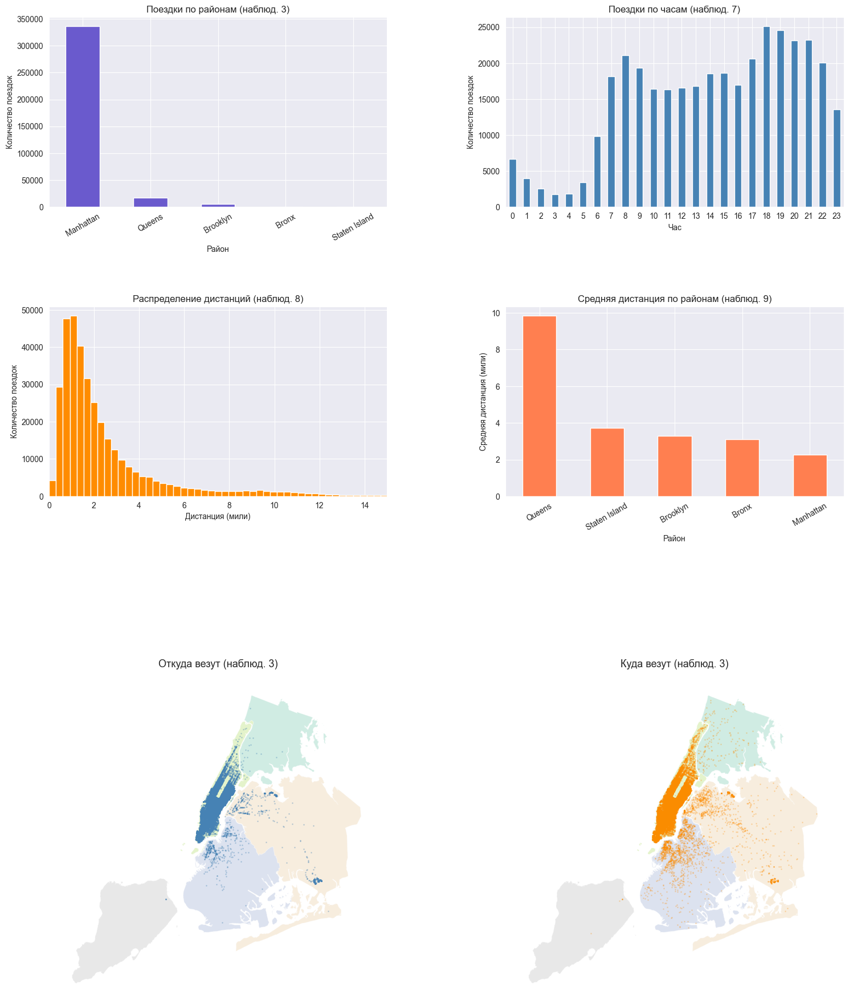

In [15]:
sample = df.sample(30000, random_state=42)

fig = plt.figure(figsize=(18, 24))
gs = fig.add_gridspec(3, 2, height_ratios=[1, 1, 2.5], hspace=0.35, wspace=0.35)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[1, 0])
ax4 = fig.add_subplot(gs[1, 1])
ax_pickup = fig.add_subplot(gs[2, 0])
ax_dropoff = fig.add_subplot(gs[2, 1])

# Наблюдение 3: поездки по районам
df['pickup_district'].value_counts().plot(kind='bar', ax=ax1, color='slateblue', edgecolor='white')
ax1.set_title('Поездки по районам (наблюд. 3)')
ax1.set_xlabel('Район')
ax1.set_ylabel('Количество поездок')
ax1.tick_params(axis='x', rotation=30)

# Наблюдение 7: часы пик
df['pickup_hour'].value_counts().sort_index().plot(kind='bar', ax=ax2, color='steelblue', edgecolor='white')
ax2.set_title('Поездки по часам (наблюд. 7)')
ax2.set_xlabel('Час')
ax2.set_ylabel('Количество поездок')
ax2.tick_params(axis='x', rotation=0)

# Наблюдение 8: гистограмма дистанций
ax3.hist(df['trip_distance'], bins=60, color='darkorange', edgecolor='white')
ax3.set_title('Распределение дистанций (наблюд. 8)')
ax3.set_xlabel('Дистанция (мили)')
ax3.set_ylabel('Количество поездок')
ax3.set_xlim(0, 15)

# Наблюдение 9: средняя дистанция по районам
df.groupby('pickup_district')['trip_distance'].mean().sort_values(ascending=False).plot(
    kind='bar', ax=ax4, color='coral', edgecolor='white')
ax4.set_title('Средняя дистанция по районам (наблюд. 9)')
ax4.set_xlabel('Район')
ax4.set_ylabel('Средняя дистанция (мили)')
ax4.tick_params(axis='x', rotation=30)

map_xlim = (-74.3, -73.65)
map_ylim = (40.48, 40.95)

# Карта отправлений
gdf.plot(ax=ax_pickup, column='boroname', cmap='Set2', alpha=0.3, edgecolor='white', linewidth=0.8)
ax_pickup.scatter(sample['pickup_longitude'], sample['pickup_latitude'], s=1, alpha=0.25, color='steelblue')
ax_pickup.set_title('Откуда везут (наблюд. 3)', fontsize=13)
ax_pickup.set_xlim(*map_xlim)
ax_pickup.set_ylim(*map_ylim)
ax_pickup.axis('off')

# Карта прибытий
gdf.plot(ax=ax_dropoff, column='boroname', cmap='Set2', alpha=0.3, edgecolor='white', linewidth=0.8)
ax_dropoff.scatter(sample['dropoff_longitude'], sample['dropoff_latitude'], s=1, alpha=0.2, color='darkorange')
ax_dropoff.set_title('Куда везут (наблюд. 3)', fontsize=13)
ax_dropoff.set_xlim(*map_xlim)
ax_dropoff.set_ylim(*map_ylim)
ax_dropoff.axis('off')

plt.show()

***
Это все, ты молодец &#10084;